# Cassava Disease Detection

### Setup

In [3]:
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow_datasets as tfds
import tensorflow_hub as hub

### Create Helper function

In [4]:
def plot(examples, predictions=None):
    # Get the images, labels, and optionally predictions
    images = examples['image']
    labels = examples['label']
    batch_size = len(images)
    if predictions is None:
        predictions = batch_size * [None]

    # Configure the layout of the grid
    x = np.ceil(np.sqrt(batch_size)) # 小数点以下切り上げ
    y = np.ceil(batch_size / x)
    fig = plt.figure(figsize=(x * 6, y * 7))

    for i, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
        # Render the image
        ax = fig.add_subplot(x, y, i+1)
        ax.imshow(image, aspect='auto')
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])

        # Display the label and optionally prediction
        x_label = 'Label:' + name_map[class_names[label]]
        if prediction is not None:
            x_label = 'Prediction: ' + name_map[class_names[prediction]] + '\n' + x_label
            ax.xaxis.label.set_color('green' if label == prediction else 'red')
        ax.set_xlabel(x_label)

    plt.show()

### load dataset

In [5]:
dataset, info = tfds.load('cassava', with_info=True)

Dl Completed...: 0 url [00:00, ? url/s]
Dl Completed...: 100%|██████████| 1/1 [00:00<00:00, 14.69 url/s]
Extraction completed...: 0 file [00:00, ? file/s]
Dl Completed...: 100%|██████████| 1/1 [00:00<00:00, 12.78 url/s]


Dataset cassava downloaded and prepared to ~\tensorflow_datasets\cassava\0.1.0. Subsequent calls will reuse this data.


In [6]:
info

tfds.core.DatasetInfo(
    name='cassava',
    full_name='cassava/0.1.0',
    description="""
    Cassava consists of leaf images for the cassava plant depicting healthy and
    four (4) disease conditions; Cassava Mosaic Disease (CMD), Cassava Bacterial
    Blight (CBB), Cassava Greem Mite (CGM) and Cassava Brown Streak Disease (CBSD).
    Dataset consists of a total of 9430 labelled images.
    The 9430 labelled images are split into a training set (5656), a test set(1885)
    and a validation set (1889). The number of images per class are unbalanced with
    the two disease classes CMD and CBSD having 72% of the images.
    """,
    homepage='https://www.kaggle.com/c/cassava-disease/overview',
    data_path='~\\tensorflow_datasets\\cassava\\0.1.0',
    file_format=tfrecord,
    download_size=1.26 GiB,
    dataset_size=1.26 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/filename': Text(shape=(), dtype=tf.string),
       

In [7]:
# Extend the cassava dataset classes with 'unknown'
class_names = info.features['label'].names + ['unknown']

# Map the class names to human readable names
name_map = dict(
    cmd='Mosaic Disease',
    cbb='Bacterial Blight',
    cgm='Green Mite',
    cbsd='Brown Streak Disease',
    healthy='Healthy',
    unknown='Unknown'
)

print(len(class_names), 'classes:')
print(class_names)
print([name_map[name] for name in class_names])

6 classes:
['cbb', 'cbsd', 'cgm', 'cmd', 'healthy', 'unknown']
['Bacterial Blight', 'Brown Streak Disease', 'Green Mite', 'Mosaic Disease', 'Healthy', 'Unknown']


In [10]:
# proprocessing function
def preprocess_fn(data):
    image = data['image']

    # Normalize [0, 255] to [0, 1]
    image = tf.cast(image, tf.float32)
    image = image / 255

    # Resize the images to 224 x 224
    image = tf.image.resize(image, (224, 224))

    data['image'] = image
    return data


C:\Users\hokuto\AppData\Local\Temp/ipykernel_17468/1306121532.py:16: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  ax = fig.add_subplot(x, y, i+1)


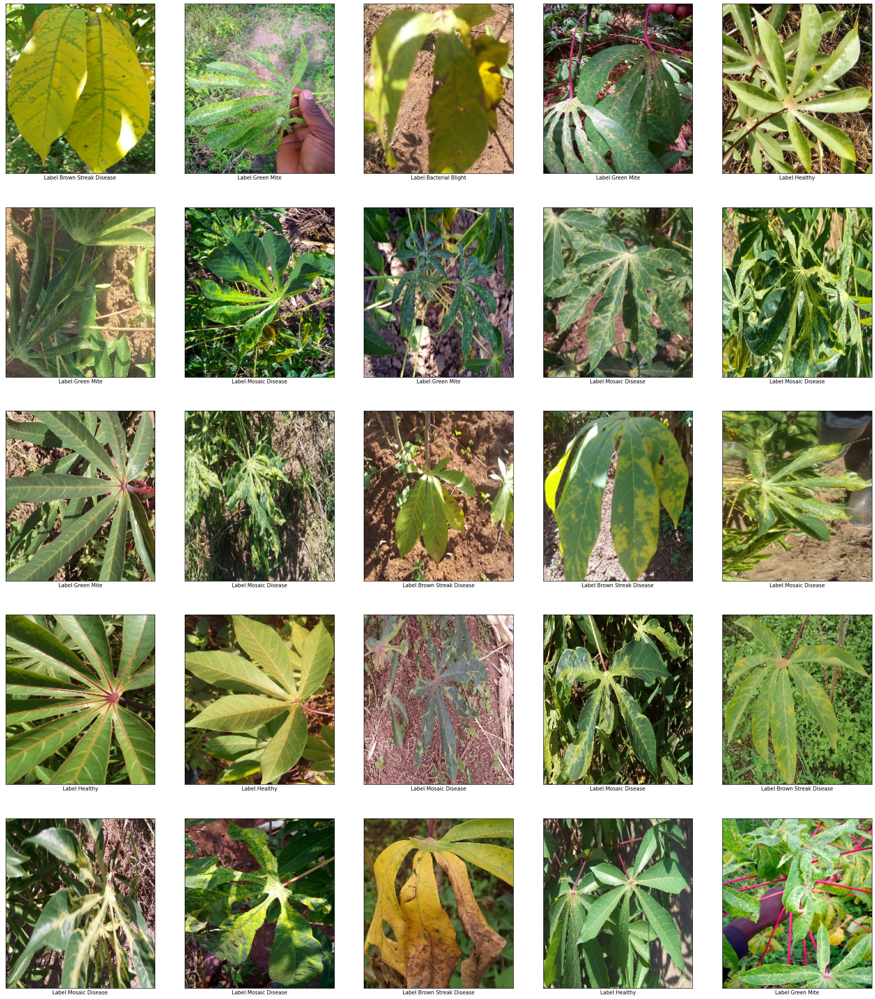

In [11]:
batch = dataset['validation'].map(preprocess_fn).batch(25).as_numpy_iterator()
examples = next(batch)
plot(examples)

### Load and prediction data

In [12]:
classifier = hub.KerasLayer('https://tfhub.dev/google/cropnet/classifier/cassava_disease_V1/2')
probabilities = classifier(examples['image'])
predictions = tf.argmax(probabilities, axis=-1)

C:\Users\hokuto\AppData\Local\Temp/ipykernel_17468/1306121532.py:16: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  ax = fig.add_subplot(x, y, i+1)


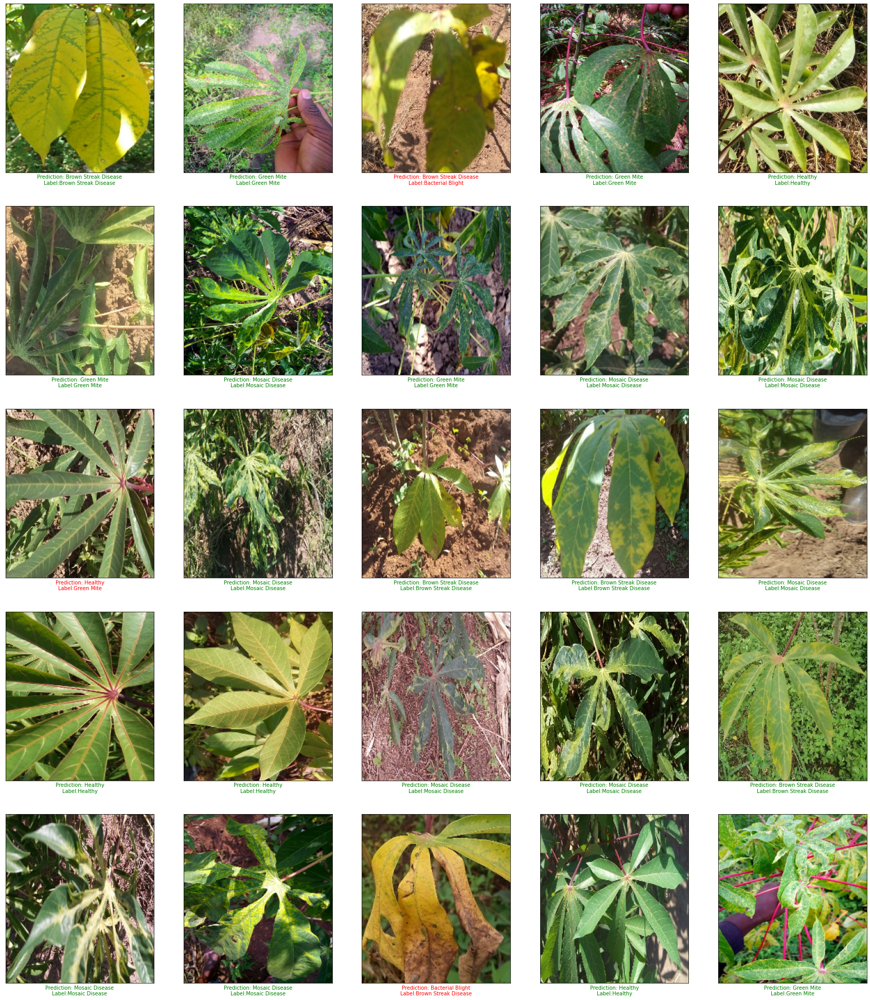

In [13]:
plot(examples, predictions)

### Rating and robustness

In [14]:
DATASET = 'cassava'
DATASET_SPLIT = 'test'
BATCH_SIZE = 32
MAX_EXAMPLES = 1000

In [15]:
def label_to_unknown_fn(data):
    data['label'] = 5 # Override label to unknown
    return data

In [16]:
# Preprocess the examples and map the image label to unknown for non-cassava datasets.
ds = tfds.load(DATASET, split=DATASET_SPLIT).map(preprocess_fn).take(MAX_EXAMPLES)
dataset_description = 'cassava'
if DATASET != 'cassava':
    ds = ds.map(label_to_unknown_fn)
    dataset_description += '(labels mapped to unknown)'
ds = ds.batch(BATCH_SIZE)

# Calculate the accuracy of the model
metric = tf.keras.metrics.Accuracy()
for examples in ds:
    probabilities = classifier(examples['image'])
    predictions = tf.math.argmax(probabilities, axis=-1)
    labels = examples['label']
    metric.update_state(labels, predictions)

print(f'Accuracy on {dataset_description}: {metric.result().numpy()}')

Accuracy on cassava: 0.878000020980835
